### Visualisation with LIME

https://donernesto.github.io/blog/explaining-text-classification-predictions-with-lime/

https://brainsteam.co.uk/2022/03/14/painless-explainability-for-text-models-with-eli5/

https://www.kdnuggets.com/2022/01/explain-nlp-models-lime.html

https://marcotcr.github.io/lime/tutorials/Lime%20-%20multiclass.html

In [1]:
import pandas as pd
import numpy as np

from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

from sklearn.svm import SVC
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, RandomForestClassifier


from lime.lime_text import LimeTextExplainer
from lime import lime_text

PATH_SENTENCE_TEXT = r"../dataset/concat_sentence_text.csv"
PATH_SEGMENT_TEXT = r"../dataset/concat_segment_text.csv"

In [2]:
# Data restructuring
df = pd.read_csv(PATH_SEGMENT_TEXT)
df_value_counts = df["practice"].value_counts().rename_axis("practice").reset_index(name = "counts")
df = df.fillna("None")

top_5_cats = list(df_value_counts["practice"][:5])
df = df[df["practice"].isin(top_5_cats)]

df.head()

,segment_text,practice,modality
2,2. THE INFORMATION WE COLLECT The information ...,Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
3,2. THE INFORMATION WE COLLECT The information ...,Identifier_IP_Address_1stParty,PERFORMED
4,"2.2 In addition, we store certain information ...",Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
12,2.6 Most browsers are initially set to accept ...,Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
13,"B) PERSONAL DATA, INCLUDING YOUR E-MAIL ADDRES...",Contact_E_Mail_Address_1stParty,PERFORMED


### Using SVC

In [3]:
# Make pipeline
svc = SVC(kernel = "linear", class_weight="balanced", probability=True)
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True)
p1 = make_pipeline(vectorizer, svc)

In [4]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)

In [6]:
p1 = p1.fit(x_train, y_train)
y_pred = p1.predict(x_test)

In [8]:
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.59      0.51      0.55       224
             Contact_Phone_Number_1stParty       0.30      0.38      0.34       121
Identifier_Cookie_or_similar_Tech_1stParty       0.83      0.80      0.82       171
            Identifier_IP_Address_1stParty       0.42      0.56      0.48       108
                         Location_1stParty       0.63      0.52      0.57       164

                                  accuracy                           0.56       788
                                 macro avg       0.56      0.55      0.55       788
                              weighted avg       0.58      0.56      0.57       788



In [9]:
idx = 40

explainer = LimeTextExplainer(class_names=p1.classes_)
exp_1 = explainer.explain_instance(df["segment_text"].iloc[idx], p1.predict_proba, num_features=5, top_labels = 2)

In [11]:
print("Explanation fit: " + str(exp_1.score))
print("Predicted category: " + str(p1.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_1.show_in_notebook(text=True)

Explanation fit: 0.8213700121855465
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Using Logistic Regression

In [12]:
# Make pipeline
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True)
p2 = make_pipeline(vectorizer, logistic)

In [13]:
p2 = p2.fit(x_train, y_train)
y_pred = p2.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.52      0.74      0.61       224
             Contact_Phone_Number_1stParty       0.20      0.08      0.12       121
Identifier_Cookie_or_similar_Tech_1stParty       0.77      0.84      0.80       171
            Identifier_IP_Address_1stParty       0.46      0.40      0.43       108
                         Location_1stParty       0.60      0.52      0.56       164

                                  accuracy                           0.57       788
                                 macro avg       0.51      0.52      0.50       788
                              weighted avg       0.53      0.57      0.54       788



In [16]:
explainer = LimeTextExplainer(class_names=p2.classes_)
exp_2 = explainer.explain_instance(df["segment_text"].iloc[idx], p2.predict_proba, num_features=5, top_labels = 2)

In [17]:
print("Explanation fit: " + str(exp_2.score))
print("Predicted category: " + str(p2.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_2.show_in_notebook(text=True)

Explanation fit: 0.8745436419905999
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Part 2: LIME with word embeddings

In [5]:
class GloveVectorizer:
    def __init__(self, verbose=False, lowercase=True, remove_stopwords = True, minchars=3):
        
        # load in pre-trained word vectors
        print('Loading word vectors...')
        word2vec = {}
        embedding = []
        idx2word = []
        with open('../glove/glove.6B/glove.6B.50d.txt', encoding = "utf-8") as f:
              # is just a space-separated text file in the format:
              # word vec[0] vec[1] vec[2] ...
              for line in f:
                values = line.split()
                word = values[0]
                vec = np.asarray(values[1:], dtype='float32')
                word2vec[word] = vec
                embedding.append(vec)
                idx2word.append(word)
        print('Found %s word vectors.' % len(word2vec))

        self.word2vec = word2vec
        self.embedding = np.array(embedding)
        self.word2idx = {v:k for k,v in enumerate(idx2word)}
        self.V, self.D = self.embedding.shape
        self.verbose = verbose
        self.lowercase = lowercase
        self.remove_stopwords = remove_stopwords
        self.minchars = minchars

        # List of feature names in the order that they are added to vecs
        self.feature_names = []
        self.feature_names_avg = []

    def fit(self, data, *args):
        pass

    def transform(self, data, *args):
        stopwords = list(text.ENGLISH_STOP_WORDS)
        X = np.zeros((len(data), self.D))
        n = 0
        emptycount = 0

        for sentence in data:
            # Note: lower-casing the words
            if self.lowercase & self.remove_stopwords:
                tokens = sentence.lower().split()
                tokens = [word for word in tokens if word not in stopwords]

            else:
                tokens = sentence.split()
                tokens = [word for word in tokens if word not in stopwords]
            
            vecs = []
            for word in tokens:
                if len(word) >= self.minchars and word in self.word2vec:
                    vec = self.word2vec[word]
                    vecs.append(vec)

                    # Add to feature names list
                    # NOTE: This is not useful since later final returned vector is a representation of the entire sentence averaged across all words.
                    self.feature_names.append(word)

            if len(vecs) > 0:
                vecs = np.array(vecs)
                
                # This takes the average word embedding value of all individual words for each sentence
                # Hence each sentence is represented by a len 50 embedding
                X[n] = vecs.mean(axis=0)
            else:
                emptycount += 1
            n += 1
        if self.verbose:
            print("Number of samples with no words found / total: %s / %s" % (emptycount, len(data)))
        return X

    def fit_transform(self, X, *args):
        self.fit(X, *args)
        return self.transform(X, *args)
    
    def get_feature_names_out(self, *args) :
        ## NOTE: This is not a useful method. See note above.
        return self.feature_names

In [5]:
gv = GloveVectorizer()

Loading word vectors...
Found 400000 word vectors.


### Using SVC

In [21]:
clf_svm = SVC(kernel = "linear", class_weight="balanced", probability=True)
p3 = make_pipeline(gv, clf_svm)

In [22]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
p3 = p3.fit(x_train, y_train)
y_pred = p3.predict(x_test)

print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.68      0.55      0.61       224
             Contact_Phone_Number_1stParty       0.42      0.57      0.48       121
Identifier_Cookie_or_similar_Tech_1stParty       0.75      0.74      0.75       171
            Identifier_IP_Address_1stParty       0.41      0.51      0.46       108
                         Location_1stParty       0.59      0.51      0.55       164

                                  accuracy                           0.58       788
                                 macro avg       0.57      0.58      0.57       788
                              weighted avg       0.60      0.58      0.59       788



In [25]:
idx = 40

explainer = LimeTextExplainer(class_names=p3.classes_)
exp_3 = explainer.explain_instance(df["segment_text"].iloc[idx], p3.predict_proba, num_features=5, top_labels = 2)

In [26]:
print("Explanation fit: " + str(exp_3.score))
print("Predicted category: " + str(p3.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_3.show_in_notebook(text=True)

Explanation fit: 0.8680630831371148
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Using Logistic regression

In [27]:
p4 = make_pipeline(gv, logistic)

In [33]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
p4 = p4.fit(x_train, y_train)
y_pred = p4.predict(x_test)

print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.58      0.79      0.67       224
             Contact_Phone_Number_1stParty       0.50      0.24      0.32       121
Identifier_Cookie_or_similar_Tech_1stParty       0.74      0.75      0.75       171
            Identifier_IP_Address_1stParty       0.49      0.38      0.43       108
                         Location_1stParty       0.57      0.58      0.57       164

                                  accuracy                           0.60       788
                                 macro avg       0.58      0.55      0.55       788
                              weighted avg       0.59      0.60      0.58       788



In [34]:
idx = 40

explainer = LimeTextExplainer(class_names=p4.classes_)
exp_4 = explainer.explain_instance(df["segment_text"].iloc[idx], p4.predict_proba, num_features=5, top_labels = 2)

In [35]:
print("Explanation fit: " + str(exp_4.score))
print("Predicted category: " + str(p4.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_4.show_in_notebook(text=True)

Explanation fit: 0.9030291909576238
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Ensemble models with word embeddings

In [47]:
idx = 63
print(df["segment_text"].iloc[idx])
print("Actual category: " + str(df["practice"].iloc[idx]))

AccuWeather and third party vendors, including Google, may use first-party cookies (such as the Google Analytics cookies) and third party cookies (such as the DoubleClick cookie) together to (a) inform, optimize and serve ads based on a user's past visits to the AccuWeather Sites, and/or (b) report how your ad impressions, other uses of ad services, and interactions with these ad impressions and ad services are related to visits to the AccuWeather Sites.
Actual category: Identifier_Cookie_or_similar_Tech_1stParty


In [37]:
# Instantiate pipelines
p5 = make_pipeline(gv, GradientBoostingClassifier(random_state=0))
p6 = make_pipeline(gv, AdaBoostClassifier(random_state=0))
p7 = make_pipeline(gv, BaggingClassifier(random_state=0, n_jobs = -1))
p8 = make_pipeline(gv, RandomForestClassifier(random_state=0, n_jobs = -1))

In [38]:
p5 = p5.fit(x_train, y_train)
y_pred = p5.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.52      0.61      0.56       224
             Contact_Phone_Number_1stParty       0.27      0.22      0.25       121
Identifier_Cookie_or_similar_Tech_1stParty       0.71      0.74      0.72       171
            Identifier_IP_Address_1stParty       0.33      0.34      0.34       108
                         Location_1stParty       0.56      0.47      0.51       164

                                  accuracy                           0.51       788
                                 macro avg       0.48      0.48      0.48       788
                              weighted avg       0.51      0.51      0.51       788



In [39]:
p6 = p6.fit(x_train, y_train)
y_pred = p6.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.55      0.64      0.59       224
             Contact_Phone_Number_1stParty       0.31      0.26      0.29       121
Identifier_Cookie_or_similar_Tech_1stParty       0.67      0.71      0.69       171
            Identifier_IP_Address_1stParty       0.28      0.23      0.25       108
                         Location_1stParty       0.47      0.44      0.45       164

                                  accuracy                           0.50       788
                                 macro avg       0.46      0.46      0.45       788
                              weighted avg       0.48      0.50      0.49       788



In [40]:
p7 = p7.fit(x_train, y_train)
y_pred = p7.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.48      0.53      0.50       224
             Contact_Phone_Number_1stParty       0.17      0.16      0.16       121
Identifier_Cookie_or_similar_Tech_1stParty       0.64      0.65      0.65       171
            Identifier_IP_Address_1stParty       0.23      0.22      0.22       108
                         Location_1stParty       0.43      0.39      0.41       164

                                  accuracy                           0.43       788
                                 macro avg       0.39      0.39      0.39       788
                              weighted avg       0.42      0.43      0.42       788



In [41]:
p8 = p8.fit(x_train, y_train)
y_pred = p8.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.46      0.55      0.51       224
             Contact_Phone_Number_1stParty       0.15      0.12      0.14       121
Identifier_Cookie_or_similar_Tech_1stParty       0.70      0.69      0.70       171
            Identifier_IP_Address_1stParty       0.25      0.21      0.23       108
                         Location_1stParty       0.44      0.43      0.44       164

                                  accuracy                           0.45       788
                                 macro avg       0.40      0.40      0.40       788
                              weighted avg       0.43      0.45      0.44       788



### We see different features highlighted as important across the different models despite their performance being relatively alike across the predicted classes.

Could be because: 1. model performance was not good to begin with, 2. LIME fits a proxy model so the fit of the proxy changes, 3. the models genuinely view the features differently.

So it is necessary to be careful not to draw too many conclusive results from the highlighted features: could explain the underlying model, or could be other reasons

In [52]:
idx = 98

explainer = LimeTextExplainer(class_names=p5.classes_)
exp_5 = explainer.explain_instance(df["segment_text"].iloc[idx], p5.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_5.score))
print("Predicted category: " + str(p5.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_5.show_in_notebook(text=True)

Explanation fit: 0.47463905843506016
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [53]:
explainer = LimeTextExplainer(class_names=p6.classes_)
exp_6 = explainer.explain_instance(df["segment_text"].iloc[idx], p6.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_6.score))
print("Predicted category: " + str(p6.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_6.show_in_notebook(text=True)

Explanation fit: 0.2176766209102935
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [54]:
explainer = LimeTextExplainer(class_names=p7.classes_)
exp_7 = explainer.explain_instance(df["segment_text"].iloc[idx], p7.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_7.score))
print("Predicted category: " + str(p7.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_7.show_in_notebook(text=True)

Explanation fit: 0.23582809204418875
Predicted category: ['Contact_Phone_Number_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [55]:
explainer = LimeTextExplainer(class_names=p8.classes_)
exp_8 = explainer.explain_instance(df["segment_text"].iloc[idx], p8.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_8.score))
print("Predicted category: " + str(p8.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_8.show_in_notebook(text=True)

Explanation fit: 0.49700003166946216
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


## Part 3: Using SHAP

https://h1ros.github.io/posts/sentiment-analysis-by-shap-with-logistic-regression/

https://medium.com/nlplanet/two-minutes-nlp-explain-predictions-with-shap-values-2a0e34219177

In [7]:
import shap
from sklearn.preprocessing import LabelEncoder

shap.initjs()

### Use logistic and tfidf - baseline test

In [15]:
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True, min_df=10)

In [16]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)

x_train_tf = vectorizer.fit_transform(x_train)
x_test_tf = vectorizer.transform(x_test)

le = LabelEncoder()
y_train = pd.Series(le.fit_transform(y_train))
y_test = pd.Series(le.transform(y_test))

logistic = logistic.fit(x_train_tf, y_train)
y_pred = logistic.predict(x_test_tf)

In [17]:
explainer = shap.LinearExplainer(logistic, x_train_tf, feature_perturbation = "interventional")
shap_vals = explainer.shap_values(x_test_tf)

x_test_array = pd.DataFrame(x_test_tf.toarray())

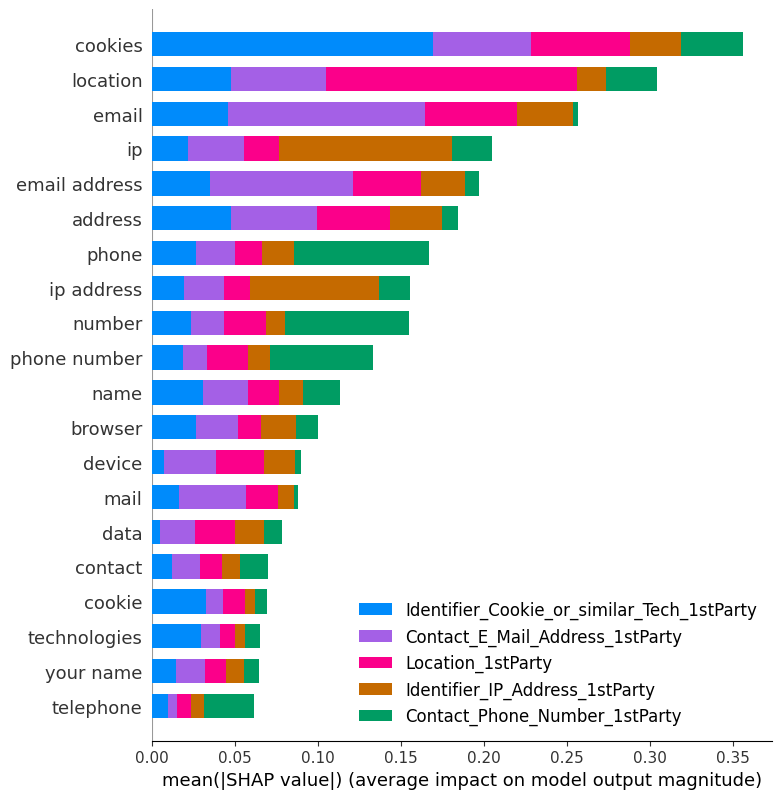

In [84]:
shap.summary_plot(shap_vals, x_test_array, feature_names = vectorizer.get_feature_names_out(), class_names = le.classes_)

In [18]:
def multi_shap_force_le(clf, index,
                        X_train_tf, y_train,
                        explainer, multi_shap_vals, feature_names,
                        le_classes,
                        classes='both'):
  
    """Takes in a fitted classifier Pipeline, the name of the classifier step,
        the X training DataFrame, the y train array, a shap explainer, and the
        multiclass shap values to print the ground truth and predicted label for
        the record and display shap force plots of the desired classes
        for the record specified by index.
    Args:
        clf (estimator): An sklearn Pipeline with a fitted classifier as the final step.
        
        clf_step_name (str): The name given to the classifier step of the pipe.
        
        index (int): The index of the observation of interest.
        
        X_train_df (DataFrame): A Pandas DataFrame that from the train-test-split
            used to train the classifier, with column names corresponding to
            the feature names.
        
        y_train (series or array): Subset of y data used for training.
        
        explainer (shap explainer): A fitted shap.TreeExplainer object
        
        multi_shap_vals (list): The list of arrays of shap values. One array per 
            target label.
        
        feature_names: Feature_names_out from fitted vectorizer.
        
        le_classes (array): The classes_ attribute of the label encoded target variable.
        
        classes (str, optional): A string specifying which shap force plots
            to display for the specified record. Options are 'all' (displays for all
            class labels), 'true' (displays only the plot for the ground truth label for
            the record), 'pred' (displays only the plot for the predicted label for
            the record), or 'both' (displays both 'true' and 'pred'). Defaults to 'both'.
    """

    ## Create dict for mapping class labels
    label_dict = {}
    for i, label in list(enumerate(le_classes)):
        label_dict[i] = label
        
    ## Store model prediction and ground truth label for that index
    # sentence_tf = fitted_vectorizer.transform(X_train_df.iloc[index,:])
    pred = int(clf.predict(X_train_tf[index].toarray()))
    true_label = pd.Series(y_train).iloc[index]


    ## Assess accuracy of prediction
    if true_label == pred:
        accurate = 'Correct!'
    else:
        accurate = 'Incorrect'
        

    ## Print output that checks model's prediction against true label
    print('***'*17)
    # Print ground truth label for row at index
    print(f'Ground Truth Label: {true_label} - {label_dict[true_label]}')
    print()
    # Print model prediction for row at index
    print(f'Model Prediction:  [{pred}] - {label_dict[pred]} -- {accurate}')
    print('***'*17)
    print()
    print()
    
 
    ## Determine which classes to show force plots for
    # All classes 
    if classes == 'all':
        ## Visualize the ith prediction's explanation for all classes
        for key in range(len(label_dict)):
            print(f'{label_dict[key]} Class ({key})')
            display(shap.force_plot(explainer.expected_value[key],
                        multi_shap_vals[key][index],
                        X_train_tf[index].toarray(), feature_names = feature_names))
            print()
    
    
    # Only the class predicted by the model
    elif classes == 'pred':
        print(f'Predicted: {label_dict[pred]} Class {pred}')
        display(shap.force_plot(explainer.expected_value[pred],
                                multi_shap_vals[pred][index],
                                X_train_tf[index].toarray(), feature_names = feature_names))

     
    # Only the ground truth label
    elif classes == 'true':
        print(f'True: {label_dict[true_label]} Class {true_label}')
        display(shap.force_plot(explainer.expected_value[true_label],
                    multi_shap_vals[true_label][index],
                    X_train_tf[index].toarray(), feature_names = feature_names))

    
    # Both the predicted and ground truth (identical plots if prediction is correct)
    elif classes == 'both':
        print(f'Predicted: {label_dict[pred]} Class {pred}')
        display(shap.force_plot(explainer.expected_value[pred],
                                multi_shap_vals[pred][index],
                                X_train_tf[index].toarray(), feature_names = feature_names))
        print()

        print(f'True: {label_dict[true_label]} Class {true_label}')
        display(shap.force_plot(explainer.expected_value[true_label],
                    multi_shap_vals[true_label][index],
                    X_train_tf[index].toarray(), feature_names = feature_names))

In [31]:
print("Sentence to classify: " + x_train.iloc[40])

multi_shap_force_le(logistic, 40, x_train_tf, y_train, explainer, shap_vals, vectorizer.get_feature_names_out(), le.classes_)

Sentence to classify: When you use Lookout Services, our servers do not record information about your mobile device, such as equipment identifiers (e.g., IMEI, UDID), subscriber identifiers (e.g., IMSI), device names, mobile phone numbers, device types and manufacturers, operating system types and versions, wireless carriers/operators, network types, countries of origin, Internet Protocol ("IP") addresses, or the dates and times of your requests.
***************************************************
Ground Truth Label: 1 - Contact_Phone_Number_1stParty

Model Prediction:  [3] - Identifier_IP_Address_1stParty -- Incorrect
***************************************************


Predicted: Identifier_IP_Address_1stParty Class 3



True: Contact_Phone_Number_1stParty Class 1


### Using SGDClassifier linear SVM as a stand in for the SVC model and tfidf

In [33]:
sgd_clf = SGDClassifier(random_state=0, n_jobs=-1)

sgd_clf = sgd_clf.fit(x_train_tf, y_train)
y_pred = sgd_clf.predict(x_test_tf)

In [35]:
explainer = shap.LinearExplainer(sgd_clf, x_train_tf, feature_perturbation = "interventional")
shap_vals = explainer.shap_values(x_test_tf)

x_test_array = pd.DataFrame(x_test_tf.toarray())

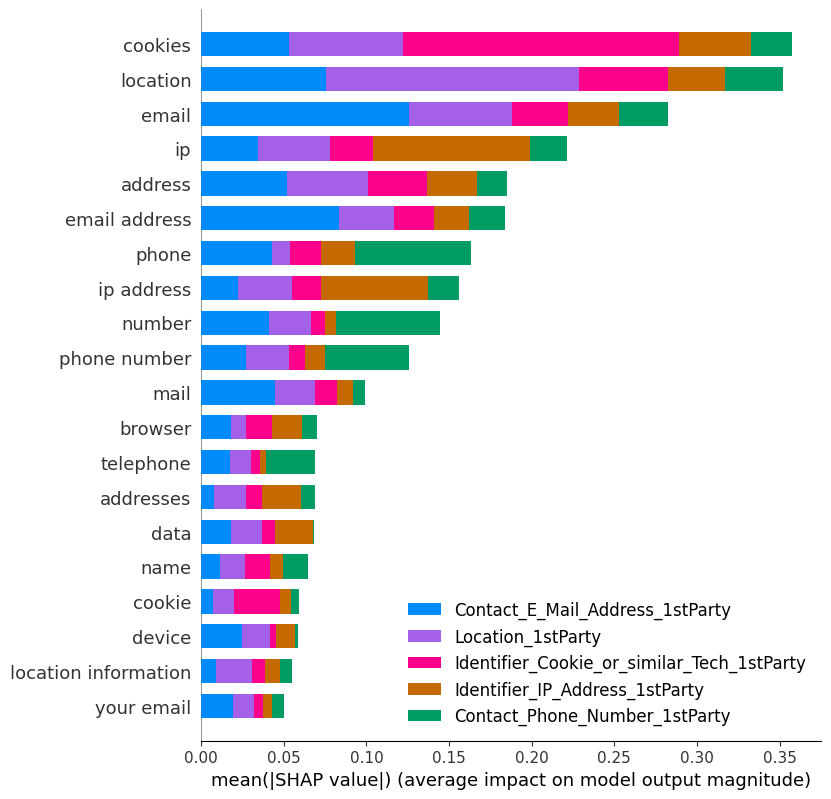

In [36]:
shap.summary_plot(shap_vals, x_test_array, feature_names = vectorizer.get_feature_names_out(), class_names = le.classes_)

In [37]:
print("Sentence to classify: " + x_train.iloc[40])

multi_shap_force_le(sgd_clf, 40, x_train_tf, y_train, explainer, shap_vals, vectorizer.get_feature_names_out(), le.classes_)

Sentence to classify: When you use Lookout Services, our servers do not record information about your mobile device, such as equipment identifiers (e.g., IMEI, UDID), subscriber identifiers (e.g., IMSI), device names, mobile phone numbers, device types and manufacturers, operating system types and versions, wireless carriers/operators, network types, countries of origin, Internet Protocol ("IP") addresses, or the dates and times of your requests.
***************************************************
Ground Truth Label: 1 - Contact_Phone_Number_1stParty

Model Prediction:  [3] - Identifier_IP_Address_1stParty -- Incorrect
***************************************************


Predicted: Identifier_IP_Address_1stParty Class 3



True: Contact_Phone_Number_1stParty Class 1


### Using logistic and glove embeddings

Explaination would not be useful since currently the individual pre-trained word embeddings for each word are averaged to have one embedding vector of len 30 for each sentence. 

Unless the GloveVectorizer class can be edited to be a document term matrix instead, with each "cell" of the DTM containing the n-dimension word vector for each word. Does not seem to make sense though, can't have nested numpy arrays within a numpy array.

Even if that is possible, don't think sklearn accepts a feature value as a numpy array instead of a single integer / float.

In [10]:
gv = GloveVectorizer()

Loading word vectors...
Found 400000 word vectors.


In [11]:
x_train_tf_gv = gv.fit_transform(x_train)
x_test_tf_gv = gv.transform(x_test)

In [14]:
len(x_train_tf_gv[0])

50

In [12]:
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
logistic = logistic.fit(x_train_tf_gv, y_train)
y_pred = logistic.predict(x_test_tf_gv)

In [13]:
explainer_1 = shap.LinearExplainer(logistic, x_train_tf_gv, feature_perturbation="interventional")
shap_vals_1 = explainer_1.shap_values(x_test_tf_gv)

In view of the compatibility issue with glove embeddings and the shap values that requires individual feature values, the below visualisation would not make sense. Each row in the numpy array is a len 50 array, representing the averaged word vector for all the words in the sentence. Hence each cell in the numpy array does not correspond to the unique glove word vector.

So the visualisation is not meaningful.

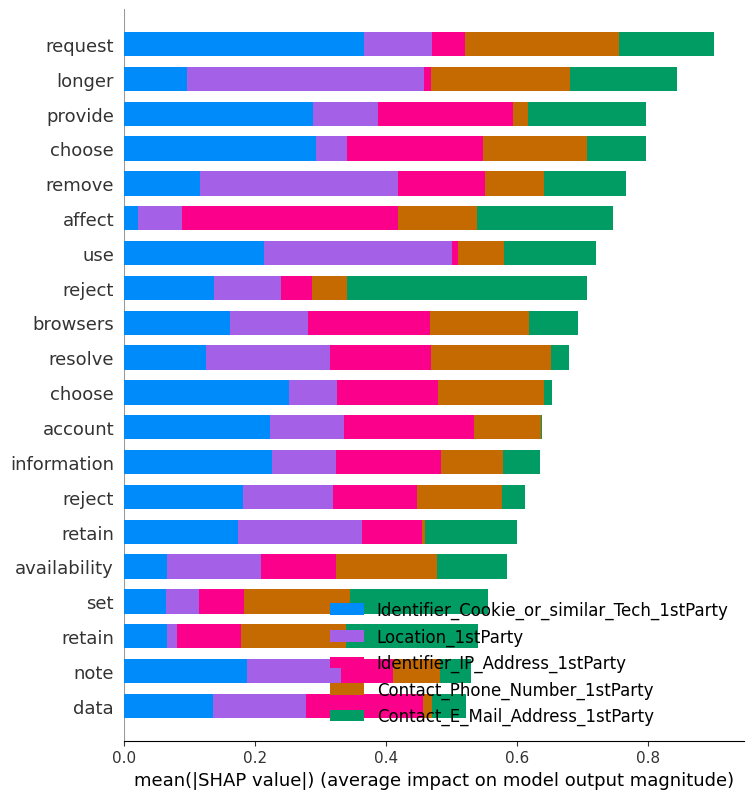

In [14]:
shap.summary_plot(shap_vals_1, pd.DataFrame(x_test_tf_gv), feature_names = gv.get_feature_names_out(), class_names = le.classes_)

### Using SVC and tfidf

SVC does not seem to work: too computationally expensive?

In [7]:
svc = SVC(kernel = "linear", class_weight="balanced", probability=True)
svc = svc.fit(x_train_tf, y_train)
y_pred = svc.predict(x_test_tf)

In [10]:
x_train_sample = shap.sample(x_train_tf, 100)
x_test_sample = shap.sample(x_test_tf, 20)

In [11]:
explainer_svc = shap.KernelExplainer(svc.predict, x_train_sample, feature_perturbation = "interventional")
shap_vals_svc = explainer_svc.shap_values(x_test_sample)

  0%|          | 0/20 [00:00<?, ?it/s]

### Part 4: Using OmniXAI

Methods: Counterfactual, integrated gradient (?), L2X

https://opensource.salesforce.com/OmniXAI/latest/tutorials/nlp/ce_classification.html

https://opensource.salesforce.com/OmniXAI/latest/tutorials/nlp/ig_tf.html

https://opensource.salesforce.com/OmniXAI/latest/tutorials/nlp/l2x.html


#### Counterfactual method: Logistic with Tfidf

In [3]:
from omnixai.data.text import Text
from omnixai.explainers.nlp.counterfactual.polyjuice import Polyjuice

c:\Users\Tristan\Desktop\Capstone ML and Data privacy\capstone-repo\capstone\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True, min_df=10)

In [7]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
pipeline = make_pipeline(vectorizer, logistic)

In [6]:
pipeline.fit(x_train, y_train)

Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(binary=True, min_df=10, ngram_range=(1, 4),
                                 stop_words={'english'},
                                 strip_accents='ascii')),
                ('logisticregression',
                 LogisticRegression(max_iter=500, multi_class='ovr', n_jobs=-1,
                                    random_state=1))])

In [7]:
explainer = Polyjuice(predict_function=pipeline.predict_proba)

ModuleNotFoundError: No module named 'polyjuice'

In [5]:
from omnixai.explainers.nlp.agnostic.l2x import L2XText
from omnixai.preprocessing.text import Tfidf

In [8]:
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
transform = Tfidf(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True, min_df=10).fit(x_train)

In [9]:
train_vectors = transform.transform(Text(x_train.tolist()))
test_vectors = transform.transform(Text(x_test.tolist()))


logistic.fit(train_vectors, y_train)
predict_function = lambda x: logistic.predict_proba(transform.transform(x))

In [10]:
idx = 40

explainer = L2XText(training_data=x_train, predict_function=predict_function, mode = "classification")

explanations = explainer.explain(x_test[idx])
explanations.ipython_plot()

AttributeError: 'Series' object has no attribute 'to_tokens'

## Other visualisation packages

Using interpret text
- https://coderzcolumn.com/tutorials/machine-learning/interpret-text-interpret-nlp-models-and-their-predictions


OmniXai
- https://blog.salesforceairesearch.com/omnixai/
- https://opensource.salesforce.com/OmniXAI/latest/tutorials/nlp/l2x.html
- https://opensource.salesforce.com/OmniXAI/latest/omnixai.explainers.nlp.html
- https://opensource.salesforce.com/OmniXAI/latest/omnixai.data.html